# Mobile Price Classification - EDA and Machine Learning Model Implementation - MentorNess Internship Program

## Problem Statement:
The task is to build a predictive model that can accurately classify mobile phones into predefined price ranges based on various attributes such as battery power, camera features, memory, connectivity options and more. The dataset provided contains information about several mobile phones, including their specifications and corresponding price ranges.

# Libraries Importing

These are the needed library imports for problem setup.
* Numpy is utilized to provide many numerical functions needed in the EDA .

* Pandas is very helpful for its ability to support data manipulation (McKinney, 2010). 
* SciPy is utilized to provide signal processing functions (Jones E., et al, 2001). 
* Matplotlib is used for plotting (Hunter, 2007).
* seaborn is used for plotting also

* The Jupyter environment in which this code is presented and was run is a descendant of the IPython environment originated by Pérez & Granger (2007).

#  Dataset Description: 
The dataset comprises the following columns: 
* battery_power: Total energy a battery can store in mAh. 
* blue: Bluetooth enabled (1 if yes, 0 if no). 
* clock_speed: Speed at which microprocessor executes instructions. 
* dual_sim: Dual SIM support (1 if yes, 0 if no). 
* fc: Front Camera mega pixels. 
* four_g: 4G network support (1 if yes, 0 if no). 
* int_memory: Internal Memory (in gigabytes). 
* m_dep: Mobile Depth in cm. 
* mobile_wt: Weight of mobile phone. 
* n_cores: Number of cores of the processor. 
* pc: Primary Camera mega pixels. 
* px_height: Pixel Resolution Height. 
* px_width: Pixel Resolution Width. 
* ram: Random Access Memory in megabytes. 
* sc_h: Screen Height of mobile in cm. 
* sc_w: Screen Width of mobile in cm. 
* talk_time: Longest time that a single battery charge will last when you are talking. 
* three_g: 3G network support (1 if yes, 0 if no). 
* touch_screen: Touch screen support (1 if yes, 0 if no). 
* wifi: Wifi connectivity (1 if yes, 0 if no). 
* price_range: Price range of the mobile phone (0 - low cost, 1 - medium cost, 2 - high cost, 3 - very high cost).

# Objectives: 
* Explore and preprocess the dataset to handle missing values, outliers, and any other data 
inconsistencies. 
* Perform exploratory data analysis (EDA) to gain insights into the relationships between different 
features and the target variable (price range). 
* Select appropriate machine learning algorithms for classification and evaluate their performance 
using suitable metrics. 
* Fine-tune the chosen model to improve its predictive accuracy. 
* Validate the final model using cross-validation techniques to ensure its robustness. 
* Deploy the model for real-time predictions if applicable.

In [24]:
# Standard Imports
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
sns.set_palette('Set2')
import category_encoders as ce

# Classifiers to Use
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier

# Other needed imports
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import StackingClassifier
from sklearn.impute import SimpleImputer
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import GridSearchCV

import warnings
warnings.filterwarnings("ignore")

# Exploratory Data Analysis 

In [7]:
df = pd.read_csv(r'D:\Projects and All\gitupload\upload-folders\DataScienceProject2\DataScienceProject\IBMDataSciencePortfolio\Mobile_Price_Classification\DatasetAndAll\train.csv')

In [8]:
df.tail(5)

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
1995,794,1,0.5,1,0,1,2,0.8,106,6,...,1222,1890,668,13,4,19,1,1,0,0
1996,1965,1,2.6,1,0,0,39,0.2,187,4,...,915,1965,2032,11,10,16,1,1,1,2
1997,1911,0,0.9,1,1,1,36,0.7,108,8,...,868,1632,3057,9,1,5,1,1,0,3
1998,1512,0,0.9,0,4,1,46,0.1,145,5,...,336,670,869,18,10,19,1,1,1,0
1999,510,1,2.0,1,5,1,45,0.9,168,6,...,483,754,3919,19,4,2,1,1,1,3


In [9]:
print('the dataset size is :',df.shape)

the dataset size is : (2000, 21)


In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   battery_power  2000 non-null   int64  
 1   blue           2000 non-null   int64  
 2   clock_speed    2000 non-null   float64
 3   dual_sim       2000 non-null   int64  
 4   fc             2000 non-null   int64  
 5   four_g         2000 non-null   int64  
 6   int_memory     2000 non-null   int64  
 7   m_dep          2000 non-null   float64
 8   mobile_wt      2000 non-null   int64  
 9   n_cores        2000 non-null   int64  
 10  pc             2000 non-null   int64  
 11  px_height      2000 non-null   int64  
 12  px_width       2000 non-null   int64  
 13  ram            2000 non-null   int64  
 14  sc_h           2000 non-null   int64  
 15  sc_w           2000 non-null   int64  
 16  talk_time      2000 non-null   int64  
 17  three_g        2000 non-null   int64  
 18  touch_sc

In [11]:
df.describe()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
count,2000.000000,2000.0000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,...,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,1238.518500,0.4950,1.522250,0.509500,4.309500,0.521500,32.046500,0.501750,140.249000,4.520500,...,645.108000,1251.515500,2124.213000,12.306500,5.767000,11.011000,0.761500,0.503000,0.507000,1.500000
std,439.418206,0.5001,0.816004,0.500035,4.341444,0.499662,18.145715,0.288416,35.399655,2.287837,...,443.780811,432.199447,1084.732044,4.213245,4.356398,5.463955,0.426273,0.500116,0.500076,1.118314
min,501.000000,0.0000,0.500000,0.000000,0.000000,0.000000,2.000000,0.100000,80.000000,1.000000,...,0.000000,500.000000,256.000000,5.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000
25%,851.750000,0.0000,0.700000,0.000000,1.000000,0.000000,16.000000,0.200000,109.000000,3.000000,...,282.750000,874.750000,1207.500000,9.000000,2.000000,6.000000,1.000000,0.000000,0.000000,0.750000
50%,1226.000000,0.0000,1.500000,1.000000,3.000000,1.000000,32.000000,0.500000,141.000000,4.000000,...,564.000000,1247.000000,2146.500000,12.000000,5.000000,11.000000,1.000000,1.000000,1.000000,1.500000
75%,1615.250000,1.0000,2.200000,1.000000,7.000000,1.000000,48.000000,0.800000,170.000000,7.000000,...,947.250000,1633.000000,3064.500000,16.000000,9.000000,16.000000,1.000000,1.000000,1.000000,2.250000
max,1998.000000,1.0000,3.000000,1.000000,19.000000,1.000000,64.000000,1.000000,200.000000,8.000000,...,1960.000000,1998.000000,3998.000000,19.000000,18.000000,20.000000,1.000000,1.000000,1.000000,3.000000


In [12]:
df.nunique()

battery_power    1094
blue                2
clock_speed        26
dual_sim            2
fc                 20
four_g              2
int_memory         63
m_dep              10
mobile_wt         121
n_cores             8
pc                 21
px_height        1137
px_width         1109
ram              1562
sc_h               15
sc_w               19
talk_time          19
three_g             2
touch_screen        2
wifi                2
price_range         4
dtype: int64

In [13]:
df.isna().sum()

battery_power    0
blue             0
clock_speed      0
dual_sim         0
fc               0
four_g           0
int_memory       0
m_dep            0
mobile_wt        0
n_cores          0
pc               0
px_height        0
px_width         0
ram              0
sc_h             0
sc_w             0
talk_time        0
three_g          0
touch_screen     0
wifi             0
price_range      0
dtype: int64

In [14]:
corr=df.corr()
corr.style.background_gradient(cmap='coolwarm')

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
battery_power,1.000000,0.011252,0.011482,-0.041847,0.033334,0.015665,-0.004004,0.034085,0.001844,-0.029727,0.031441,0.014901,-0.008402,-0.000653,-0.029959,-0.021421,0.052510,0.011522,-0.010516,-0.008343,0.200723
blue,0.011252,1.000000,0.021419,0.035198,0.003593,0.013443,0.041177,0.004049,-0.008605,0.036161,-0.009952,-0.006872,-0.041533,0.026351,-0.002952,0.000613,0.013934,-0.030236,0.010061,-0.021863,0.020573
clock_speed,0.011482,0.021419,1.000000,-0.001315,-0.000434,-0.043073,0.006545,-0.014364,0.012350,-0.005724,-0.005245,-0.014523,-0.009476,0.003443,-0.029078,-0.007378,-0.011432,-0.046433,0.019756,-0.024471,-0.006606
dual_sim,-0.041847,0.035198,-0.001315,1.000000,-0.029123,0.003187,-0.015679,-0.022142,-0.008979,-0.024658,-0.017143,-0.020875,0.014291,0.041072,-0.011949,-0.016666,-0.039404,-0.014008,-0.017117,0.022740,0.017444
fc,0.033334,0.003593,-0.000434,-0.029123,1.000000,-0.016560,-0.029133,-0.001791,0.023618,-0.013356,0.644595,-0.009990,-0.005176,0.015099,-0.011014,-0.012373,-0.006829,0.001793,-0.014828,0.020085,0.021998
four_g,0.015665,0.013443,-0.043073,0.003187,-0.016560,1.000000,0.008690,-0.001823,-0.016537,-0.029706,-0.005598,-0.019236,0.007448,0.007313,0.027166,0.037005,-0.046628,0.584246,0.016758,-0.017620,0.014772
int_memory,-0.004004,0.041177,0.006545,-0.015679,-0.029133,0.008690,1.000000,0.006886,-0.034214,-0.028310,-0.033273,0.010441,-0.008335,0.032813,0.037771,0.011731,-0.002790,-0.009366,-0.026999,0.006993,0.044435
m_dep,0.034085,0.004049,-0.014364,-0.022142,-0.001791,-0.001823,0.006886,1.000000,0.021756,-0.003504,0.026282,0.025263,0.023566,-0.009434,-0.025348,-0.018388,0.017003,-0.012065,-0.002638,-0.028353,0.000853
mobile_wt,0.001844,-0.008605,0.012350,-0.008979,0.023618,-0.016537,-0.034214,0.021756,1.000000,-0.018989,0.018844,0.000939,0.000090,-0.002581,-0.033855,-0.020761,0.006209,0.001551,-0.014368,-0.000409,-0.030302
n_cores,-0.029727,0.036161,-0.005724,-0.024658,-0.013356,-0.029706,-0.028310,-0.003504,-0.018989,1.000000,-0.001193,-0.006872,0.024480,0.004868,-0.000315,0.025826,0.013148,-0.014733,0.023774,-0.009964,0.004399


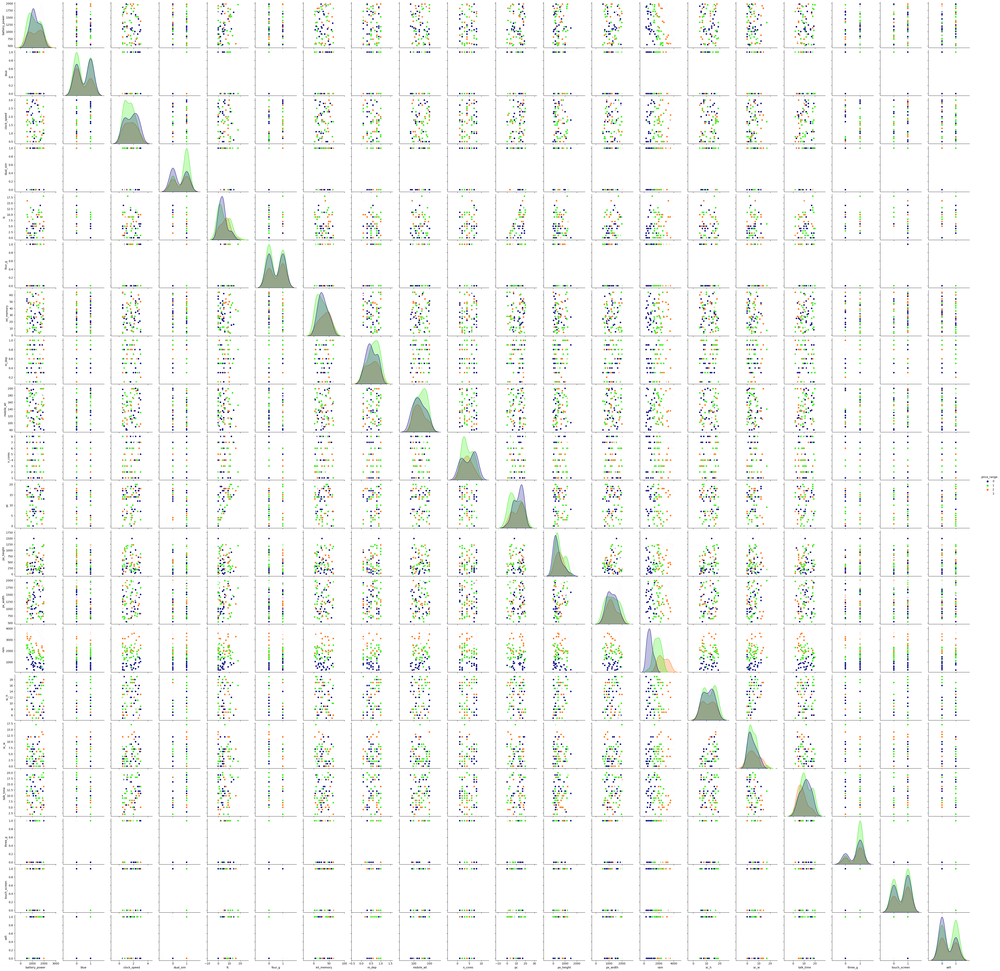

In [15]:
sns.pairplot(data=df.sample(100) ,hue='price_range' , palette='gist_ncar') 

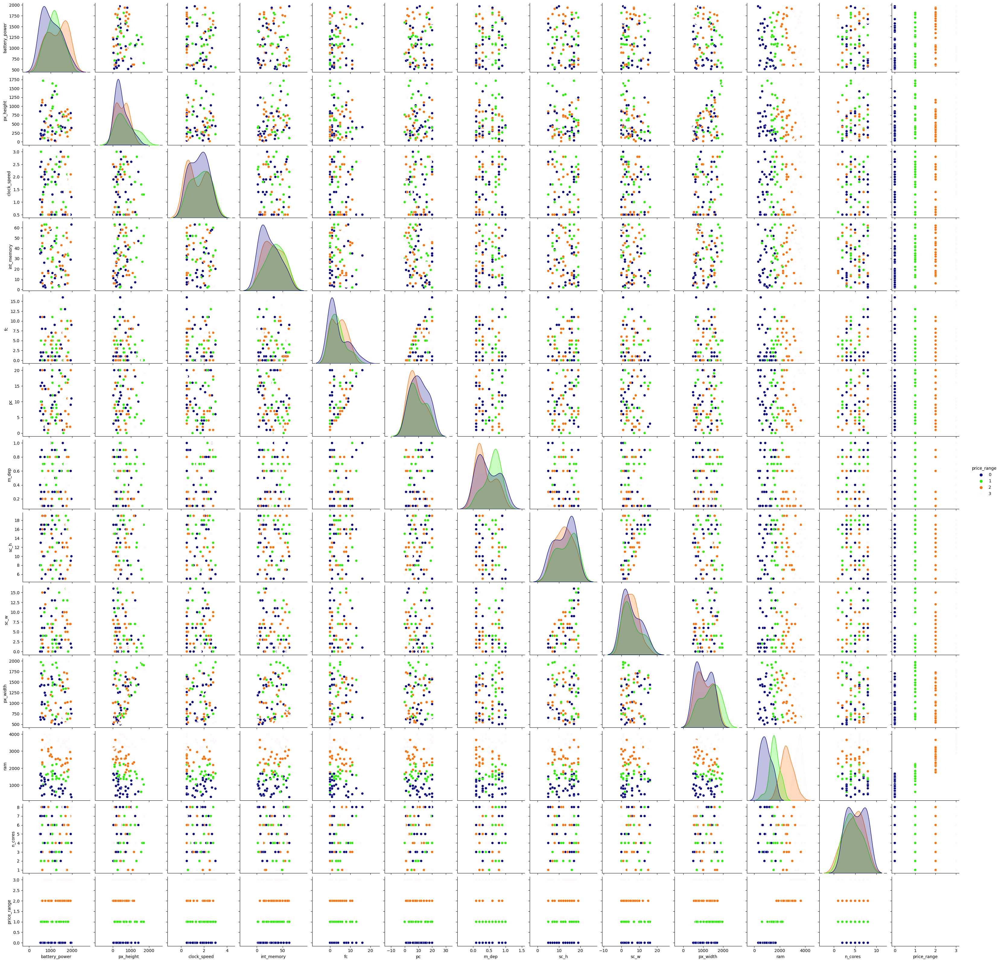

In [16]:

x_vars='battery_power','px_height','clock_speed','int_memory','fc','pc','m_dep','sc_h', 'sc_w','px_width', 'ram','n_cores','price_range'
y_vars='battery_power','px_height','clock_speed','int_memory','fc','pc','m_dep','sc_h', 'sc_w','px_width', 'ram','n_cores','price_range'
sns.pairplot(data=df.sample(100) ,hue='price_range' , palette='gist_ncar',x_vars=x_vars ,y_vars=y_vars )

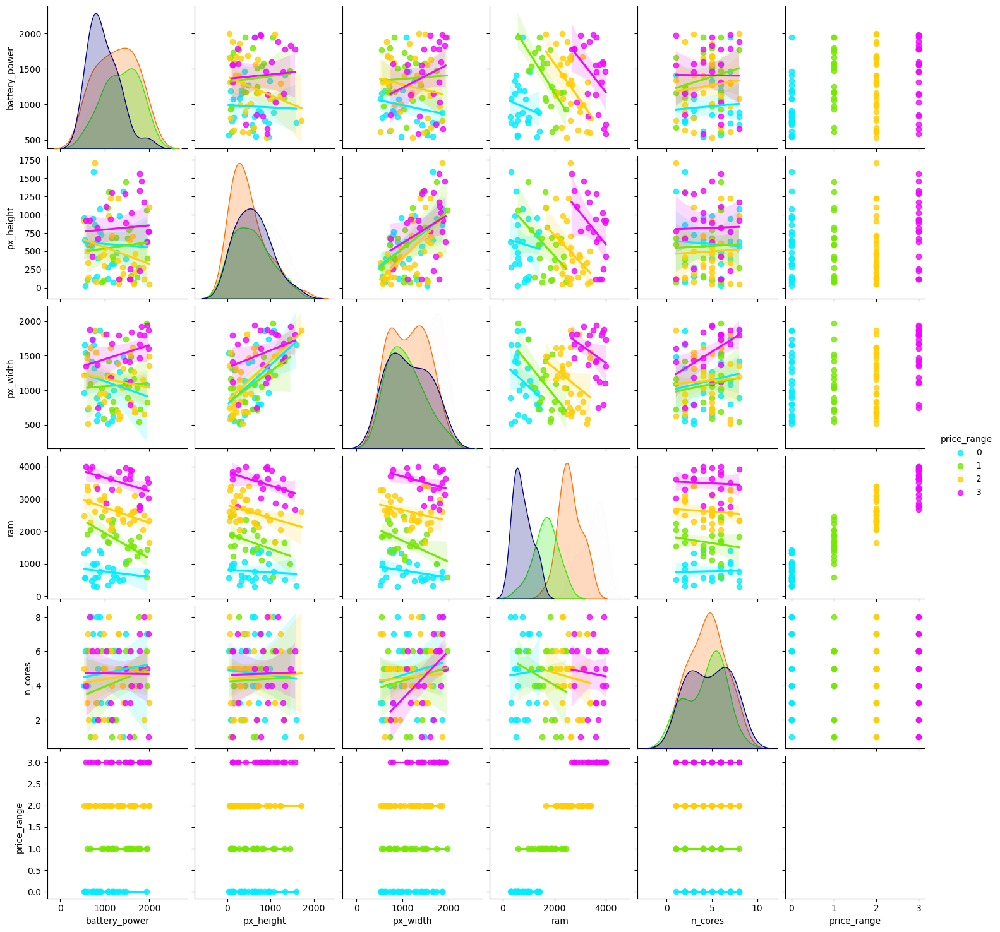

In [17]:

x_vars='battery_power','px_height', 'px_width', 'ram','n_cores','price_range'
y_vars='battery_power','px_height', 'px_width', 'ram','n_cores', 'price_range'
sns.pairplot(data=df.sample(100) ,hue='price_range' , palette='gist_ncar',x_vars=x_vars ,y_vars=y_vars, kind= 'reg')


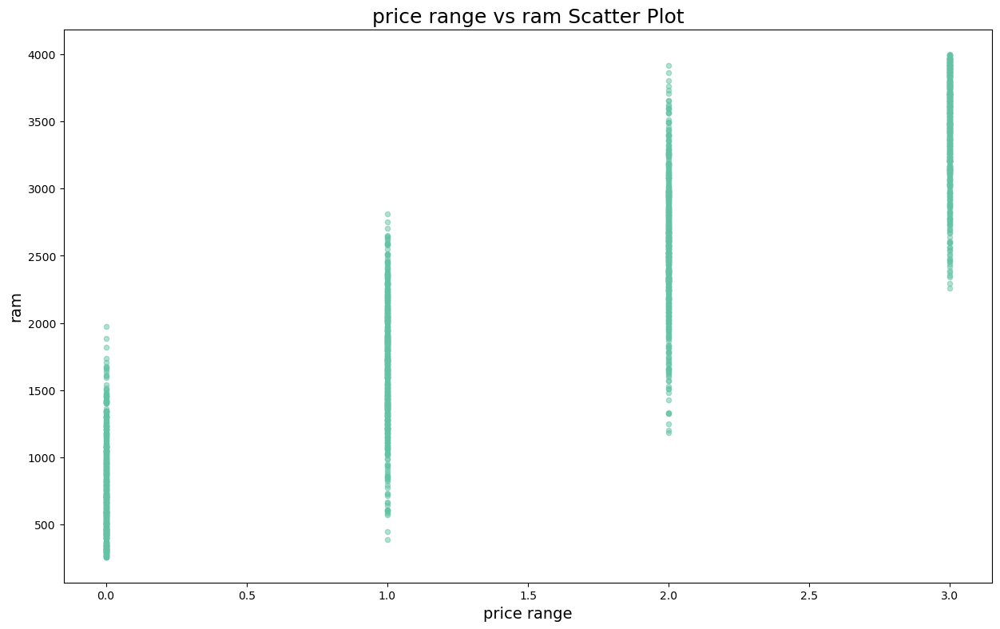

In [18]:
df.plot(kind='scatter', x='price_range', y='ram',alpha = 0.5,figsize=(15,9))
plt.xlabel('price range',fontdict={'fontsize':14})          
plt.ylabel('ram' ,fontdict={'fontsize':14})
plt.title('price range vs ram Scatter Plot',fontdict={'fontsize':18}) ;       

In [19]:
# Plotting all data 
df_vis = df
df_vis.plot(kind= 'density',subplots = True,figsize=(100,200),title='Desity of feature over all' ,fontsize=18 )
plt.show()


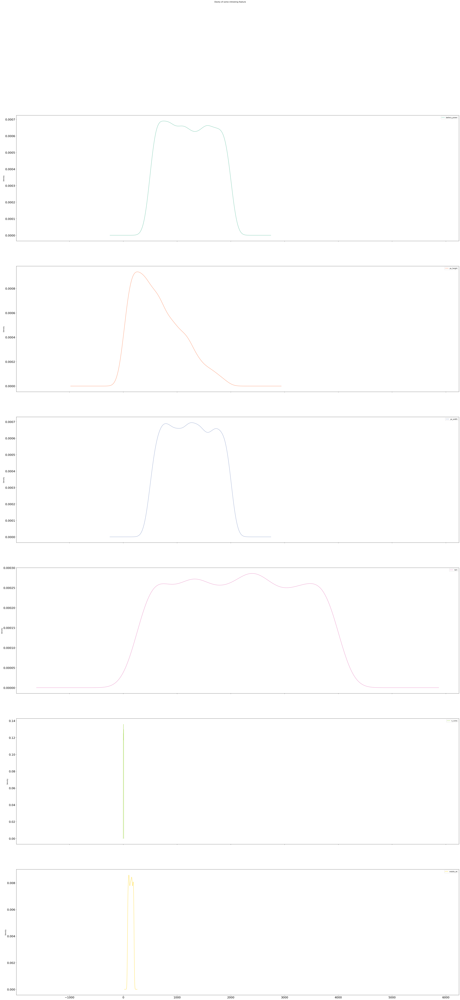

In [20]:
# Plotting all data 
df_vis = df.loc[:,['battery_power','px_height', 'px_width', 'ram','n_cores','mobile_wt']]
df_vis.plot(kind= 'density',subplots = True,figsize=(50,100) ,title='Desity of some intresting feature ' ,fontsize=18 )

plt.show()
# it is confusing

<Axes: xlabel='price_range', ylabel='int_memory'>

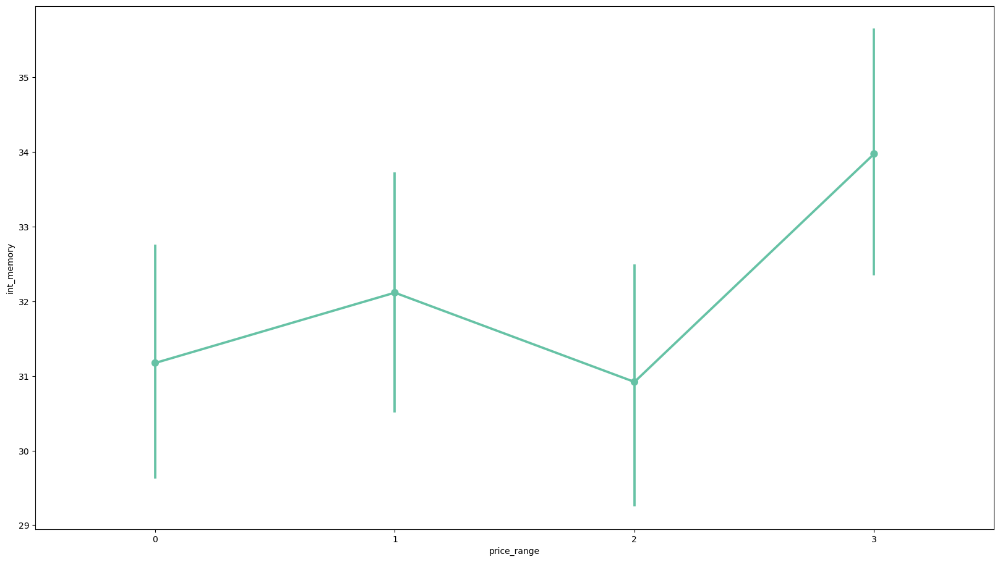

In [21]:
fig=plt.figure(figsize=(20,11))
sns.pointplot(y="int_memory", x="price_range", data=df)

<Axes: xlabel='price_range', ylabel='talk_time'>

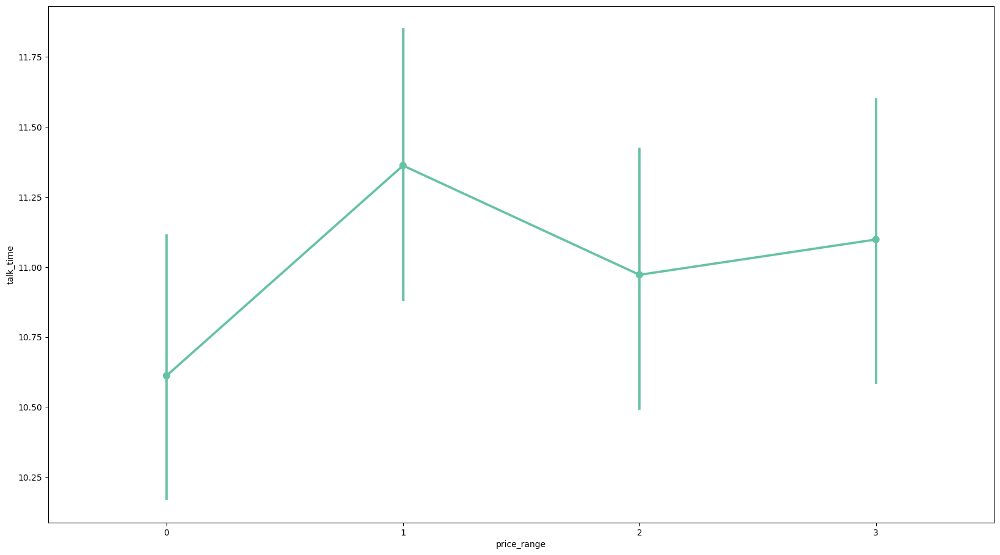

In [22]:
fig=plt.figure(figsize=(20,11))
sns.pointplot(y="talk_time", x="price_range", data=df)

In [ ]:
fig=plt.figure(figsize=(25,11))
sns.pointplot(y="ram", x="price_range", data=df)

In [ ]:
#pie chart 

f,ax=plt.subplots(1,2,figsize=(12,12))
df['n_cores'].value_counts().plot.pie(autopct='%1.1f%%',ax=ax[0],shadow=True)
df['pc'].value_counts().plot.pie(autopct='%1.1f%%',ax=ax[1],shadow=True)




ax[0].set_title('n_cores ')
ax[1].set_title(' pc ')

plt.show()

In [ ]:
labels = ["supported",'Not supported']
f,ax=plt.subplots(1,2,figsize=(12,12))
df['three_g'].value_counts().plot.pie(autopct='%1.1f%%',ax=ax[0],shadow=True, labels=labels)
df['four_g'].value_counts().plot.pie(autopct='%1.1f%%',ax=ax[1],shadow=True, labels=labels)




ax[0].set_title('three_g ')
ax[1].set_title(' four_g ')

plt.show()

In [ ]:
labels = ["supported",'Not supported']
f,ax=plt.subplots(1,2,figsize=(12,12))
df['wifi'].value_counts().plot.pie(autopct='%1.1f%%',ax=ax[0],shadow=True, labels=labels)
df['blue'].value_counts().plot.pie(autopct='%1.1f%%',ax=ax[1],shadow=True, labels=labels)




ax[0].set_title('wifi ')
ax[1].set_title(' bluetooth ')

plt.show()

In [ ]:
labels = ["supported",'Not supported']
f,ax=plt.subplots(1,2,figsize=(12,12))
df['touch_screen'].value_counts().plot.pie(autopct='%1.1f%%',ax=ax[0],shadow=True, labels=labels)
df['dual_sim'].value_counts().plot.pie(autopct='%1.1f%%',ax=ax[1],shadow=True, labels=labels)




ax[0].set_title('touch_screen ')
ax[1].set_title(' dual_sim ')

plt.show()

In [ ]:
fig=plt.figure(figsize=(25,11))
# col=['id','target']
sns.boxplot(data=df)
plt.show()

In [ ]:
fig=plt.figure(figsize=(10,11)) #why 3g represent like this !!
sns.boxplot(data=df[['three_g', 'four_g','touch_screen', 'wifi' ,'dual_sim', 'blue']])
plt.show()

In [ ]:
fig=plt.figure(figsize=(10,11))

sns.boxplot(data=df[[ 'clock_speed',  'price_range','m_dep']])
plt.show()

In [ ]:
fig=plt.figure(figsize=(10,11))

sns.boxplot(data=df[[ 'clock_speed',  'price_range','m_dep']])
plt.show()

In [ ]:
sns.boxplot(data=df[[   'n_cores' ,'sc_w']])
plt.show()

In [ ]:
fig=plt.figure(figsize=(10,11))
sns.boxplot(data=df[['sc_h', 'pc', 'talk_time']])
plt.show()

In [ ]:
fig=plt.figure(figsize=(10,11))
sns.boxplot(data=df['int_memory'])
plt.show()

In [ ]:
fig=plt.figure(figsize=(10,11))
sns.boxplot(data=df['mobile_wt'])
plt.show()

In [ ]:
fig=plt.figure(figsize=(10,11))
sns.boxplot(data=df[[ 'px_height','px_width', 'ram']])
plt.show()

In [ ]:
fig=plt.figure(figsize=(10,11)) # there is outlier in Front Camera mega pixels but that's normal , we didn't need to remove it 
sns.boxplot(data=df['fc'])
plt.show()

In [ ]:
# df.fc.value_counts()
plt.figure(figsize=(10,6))

sns.countplot(x='fc', data=df, hue= 'price_range').set_title('the rang of price based on Front Camera mega pixels',fontsize=12);

In [ ]:
plt.figure(figsize=(10,6))

sns.countplot(x='pc', data=df, hue= 'price_range').set_title('the rang of price based on Primary Camera mega pixels',fontsize=12);

In [ ]:
# Distribution graphs (histogram/bar graph) of column data
def plotPerColumnDistribution(df, nGraphShown, nGraphPerRow):
    nunique = df.nunique()
    df = df[[col for col in df if nunique[col] > 2 ]] # For displaying purposes, pick columns that have between 2 and 50 unique values
    nRow, nCol = df.shape
    columnNames = list(df)
    nGraphRow = (nCol + nGraphPerRow - 1) / nGraphPerRow
    plt.figure(num = None, figsize = (6 * nGraphPerRow, 8 * nGraphRow), dpi = 80, facecolor = 'w', edgecolor = 'k')
    for i in range(min(nCol, nGraphShown)):
        plt.subplot(nGraphRow, nGraphPerRow, i + 1)
        columnDf = df.iloc[:, i]
        if (not np.issubdtype(type(columnDf.iloc[0]), np.number)):
            valueCounts = columnDf.value_counts()
            valueCounts.plot.bar()
        else:
            columnDf.hist()
        plt.ylabel('counts')
        plt.xticks(rotation = 90)
        plt.title(f'{columnNames[i]} (column {i})')
    plt.tight_layout(pad = 1.0, w_pad = 1.0, h_pad = 1.0)
    plt.show()


In [ ]:
plotPerColumnDistribution(df, 15, 5)

In [ ]:
plt.figure(figsize=(10,6))

sns.countplot(x='wifi', data=df, hue= 'price_range').set_title('the rang of price based on wifi Feature ',fontsize=12);

In [ ]:
plt.figure(figsize=(10,6))

sns.countplot(x='four_g', data=df, hue= 'price_range').set_title('the rang of price based on ram four_g Feature',fontsize=12 );

In [ ]:
plt.figure(figsize=(10,6))

sns.lineplot(x='price_range', y='n_cores', data=df).set_title('the rang of price based on n_cores',fontsize=12);

In [ ]:
plt.figure(figsize=(10,6))

sns.lineplot(x='price_range', y='battery_power', data=df).set_title('the rang of price based on battery_power',fontsize=12);

In [ ]:
plt.figure(figsize=(10,6))

sns.lineplot(x='price_range', y='pc', data=df).set_title('the rang of price based on pc',fontsize=12);

In [ ]:
plt.figure(figsize=(20,10))

sns.lineplot(x='price_range', y='px_width', data=df).set_title('the rang of price based on px_width',fontsize=16);


In [ ]:
plt.figure(figsize=(10,6))

sns.countplot(x='n_cores', data=df, hue= 'price_range').set_title('the rang of price based on number of core',fontsize=12);

In [ ]:
#explore target 1 as df1

df0=df.loc[df.price_range==0]
df0.tail(5)
# d.loc[d.column1 == 1, d.columns[2:]]

In [ ]:
sns.pairplot(data=df0.sample(100) ,hue='ram')

In [ ]:
df0.nunique()

In [ ]:
plotPerColumnDistribution(df0, 15, 5)

In [ ]:
#explore target 1 as df1
df1=df.loc[df.price_range==1]
df1.tail(5)

In [ ]:
df1.nunique()

In [ ]:
sns.pairplot(data=df1.sample(100) ,hue='n_cores')

In [ ]:
plotPerColumnDistribution(df1, 15, 5)

In [ ]:
#explore target 2 as df2
df2=df.loc[df.price_range==2]
df2.tail(5)

In [ ]:
df2.nunique()

In [ ]:
sns.pairplot(data=df2.sample(100) ,hue='n_cores')

In [ ]:
plotPerColumnDistribution(df2, 15, 5)

In [ ]:
#explore target 3 as df3
df3=df.loc[df.price_range==3]
df3.tail(5)

In [ ]:
sns.pairplot(data=df3.sample(100) ,hue='ram')

In [ ]:
plotPerColumnDistribution(df3, 15, 5)

# Machine Learning Model Applied Starts from Here 

In [25]:
df = pd.read_csv(r'D:\Projects and All\gitupload\upload-folders\DataScienceProject2\DataScienceProject\IBMDataSciencePortfolio\Mobile_Price_Classification\DatasetAndAll\test.csv')
df = pd.read_csv(r'D:\Projects and All\gitupload\upload-folders\DataScienceProject2\DataScienceProject\IBMDataSciencePortfolio\Mobile_Price_Classification\DatasetAndAll\train.csv')
df.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1208,1212,1411,8,2,15,1,1,0,1


###Scaling the DataSet 

In [26]:
# Scale continuous features and replace in the original df
cols=['blue','dual_sim','four_g','three_g','touch_screen','wifi','price_range','n_cores']
scaler=StandardScaler()
scaled_df = pd.DataFrame(scaler.fit_transform(df.drop(df[cols], axis=1)))

###Modeling

In [27]:
#Define Modeling 
#Create a dicrionaries to hold all the Classifiers and preprocessing techniques
models ={
    "rf": make_pipeline(ce.OneHotEncoder(),SimpleImputer(strategy="median"),RandomForestClassifier()),
    "knn": make_pipeline(ce.OneHotEncoder(),SimpleImputer(strategy="median"),KNeighborsClassifier()),
    "dt": make_pipeline(ce.OneHotEncoder(),SimpleImputer(strategy="median"),DecisionTreeClassifier()),
}

In [28]:
#define cross Validtion Function to Evaluate our Models 
#evalute a given model using cross validation 

def evaluate_model(model,X,y):
    cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=2, random_state=9000)
    scores = cross_val_score(model,X,y,scoring ='accuracy',cv=cv,n_jobs=-1)
    return scores

In [29]:
#split the data 
X=df.drop("price_range", axis =1)
y=df["price_range"]

In [30]:
#define the baseline Score 
#baseline score
print("Model Baseline")
df["price_range"].value_counts(normalize=True)[0]

Model Baseline


0.25

In [31]:
#applying Model 
#Evaluate model on their own 


result_ls = []
model_ls = []


# Iterate over models dict and evalute each separately 

for key, value in models.items():

    # gather scores KFold cross validation scores
    score = evaluate_model(value, X, y)
    result_ls.append(score) # save results
    model_ls.append(key) # save model name
    print(f"Model: {key}, Score: {np.mean(score)}")

Model: rf, Score: 0.88175
Model: knn, Score: 0.92275
Model: dt, Score: 0.82925


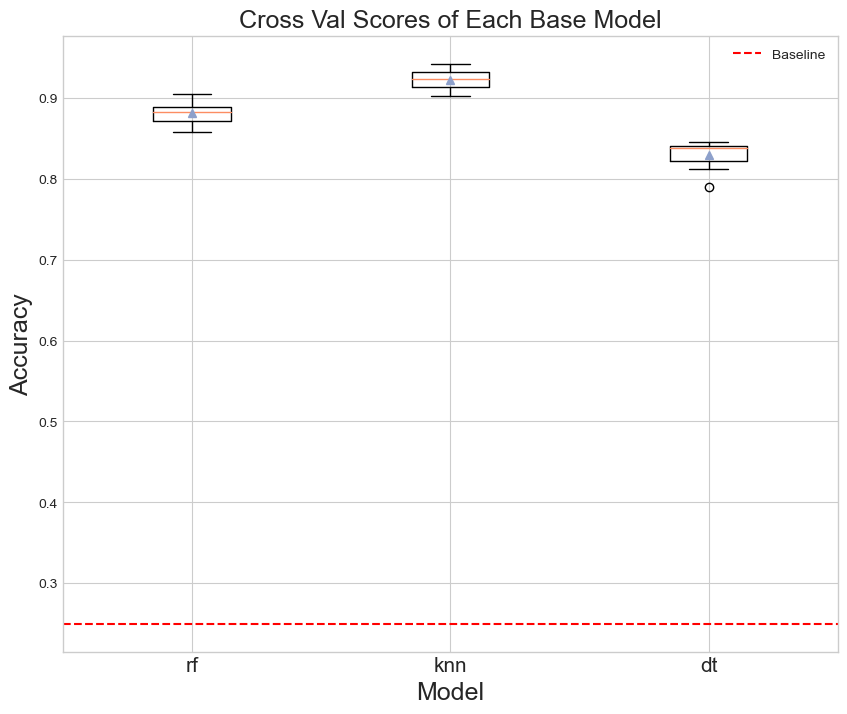

In [32]:
#comparing Models

#Looking at our crossval score boxplots we can see that KNN models are performing pretty much HIGHER than others.

plt.style.use("seaborn-whitegrid")
plt.figure(figsize=(10,8))
plt.boxplot(result_ls, labels=model_ls, showmeans=True )
plt.title("Cross Val Scores of Each Base Model",fontsize=18)
plt.xlabel("Model",fontsize=18)
plt.xticks(fontsize=15)
plt.axhline(y=.25, linestyle="--", c="r", label="Baseline")
plt.legend()
plt.ylabel("Accuracy",fontsize=18);

In [33]:
# Stacking Classifier is expecting a list
stack_ls = [
            ("rf", make_pipeline(ce.OneHotEncoder(), SimpleImputer(strategy="median"),RandomForestClassifier())), #  Random forest intead 
            ("knn", make_pipeline(ce.OneHotEncoder(), SimpleImputer(strategy="median"),KNeighborsClassifier())),
            ("dt", make_pipeline(ce.OneHotEncoder(),SimpleImputer(strategy="median") ,DecisionTreeClassifier()))
            ]

# Create Stacked Classifier
stack_model = StackingClassifier(stack_ls, cv=5)

# Add stack_model to models dictionary
models["stacked"] = stack_model

In [34]:
# Evaluate All Models
result_ls = []
model_ls = []

# Iterate over models dict and evaluate each seprately
for key, value in models.items():

    # gather scores KFold cross validation scores
    score = evaluate_model(value, X, y)
    result_ls.append(score) # save results
    model_ls.append(key) # save model name
    print(f"Model: {key}, Score: {np.mean(score)}")


Model: rf, Score: 0.877
Model: knn, Score: 0.92275
Model: dt, Score: 0.8245000000000001
Model: stacked, Score: 0.9254999999999999


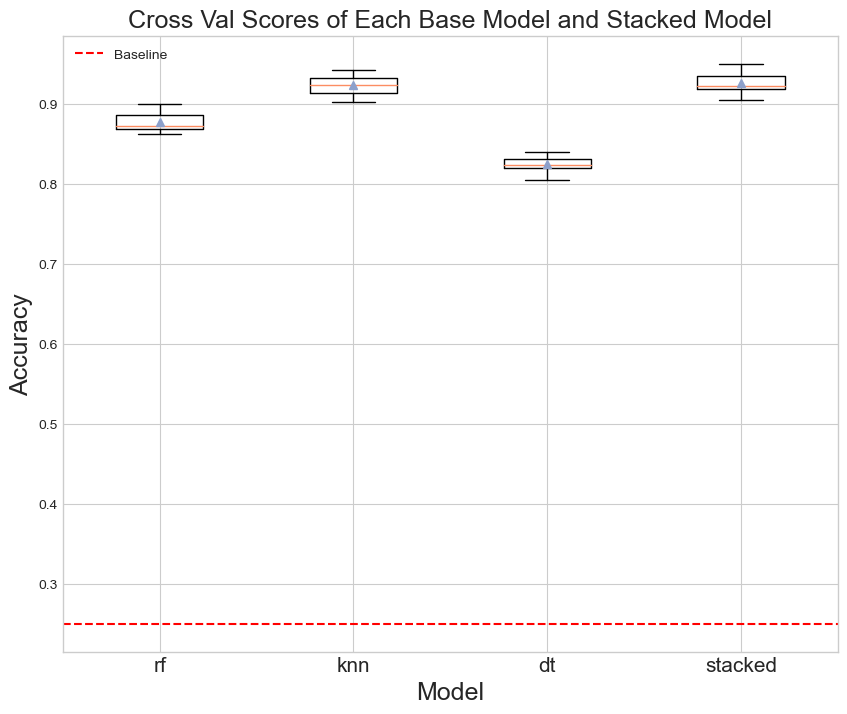

In [35]:
### compairing all models 
plt.style.use("seaborn-whitegrid")
plt.figure(figsize=(10,8))
plt.boxplot(result_ls, labels=model_ls, showmeans=True)
plt.xticks(fontsize=15)
plt.title("Cross Val Scores of Each Base Model and Stacked Model",fontsize=18)
plt.xlabel("Model",fontsize=18)
plt.axhline(0.25, linestyle="--", c="r", label="Baseline")
plt.legend()
plt.ylabel("Accuracy",fontsize=18);